# June 06, 2021

**Motivation**: Spatially homogenous parcellation **(fMRI)**. </br>

In [1]:
# HIDE CODE


import os
import ants
import nrrd

import sys
import collections
import numpy as np
import pandas as pd
import nibabel as nib
import networkx as nx
import operator as op
from os.path import join as pjoin

from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

# GitHub
git_path = pjoin(os.environ['HOME'], 'Dropbox/git/Ca-fMRI/')
sys.path.insert(0, git_path)
from utils.processing import *

# Allen
allen_ws = pjoin(os.environ['HOME'], 'Documents/workspaces/allen')
allen_path = pjoin(allen_ws, 'MouseConnectivity')
os.makedirs(allen_path, exist_ok=True)
from allensdk.core.mouse_connectivity_cache import MouseConnectivityCache
from allensdk.api.queries.ontologies_api import OntologiesApi
from allensdk.core.structure_tree import StructureTree

In [2]:
# HIDE CODE


def trim_axs(axes, n):
    axs = axes.flat
    for ax in axs[n:]:
        ax.remove()
    return axs[:n]


def add_children(g: nx.DiGraph(), structure_tree: StructureTree, src_id: int, level: int):
    src = structure_tree.get_structures_by_id([src_id])[0]
    children = structure_tree.children([src_id])[0]
    for child in children:
        src_name = '\n'.join(src['name'].split(' '))
        tgt_name = '\n'.join(child['name'].split(' '))
        g.add_node(tgt_name, lvl=level)
        g.add_edge(src_name, tgt_name)
    return g, children


def make_tree_graph(root: str, n_levels: int = 3, structure_tree: StructureTree = None):
    if structure_tree is None:
        mcc = MouseConnectivityCache(resolution=100)
        structure_tree = mcc.get_structure_tree()
    structure = structure_tree.get_structures_by_name([root])[0]
    
    g = nx.DiGraph()
    g.add_node('\n'.join(structure['name'].split(' ')), lvl=0)

    dend = {}
    for lvl in range(n_levels):
        if lvl == 0:
            src_ids = [structure['id']]
        else:
            new_leaves = []
            for i in src_ids:
                g, children = add_children(g, structure_tree, i, lvl)
                for child in children:
                    new_leaves.append(child['id'])
            src_ids = new_leaves
        dend[lvl] = src_ids
 
    return g, dend


def reorient_arr(x: np.ndarray, tr_axes: Tuple = (2, 1, 0)):
    if len(x.shape) == 4:
        tr_axes += (3,)
    return np.transpose(x, tr_axes)[::-1]


def mask_left_right(mask: np.ndarray, left_right_axis: int = 2):
    npix = mask.shape[left_right_axis]
    coverage = int(np.ceil(npix/2))
    slices_l = tuple(
        slice(0, coverage) if i == left_right_axis else slice(mask.shape[i])
        for i in range(len(mask.shape))
    )
    slices_r = tuple(
        slice(npix-coverage, npix) if i == left_right_axis else slice(mask.shape[i])
        for i in range(len(mask.shape))
    )
    mask_l = mask.copy().astype(bool)
    mask_r = mask.copy().astype(bool)
    mask_l[slices_r] = 0
    mask_r[slices_l] = 0
    
    return mask_l.astype(bool), mask_r.astype(bool)


def kmeans_parcellation(
    mask: np.ndarray,
    num_regions: int = 256,
    symmetrize: bool = False,
    left_right_axis: int = 2,
    random_state: int = 42, ):
    
    mask_l, mask_r = mask_left_right(mask, left_right_axis)
    
    if symmetrize:
        mask_r_full = mask_r.copy()
        mask_l_full = mask_l.copy()
        mask_r_full[slices_l] = np.flip(mask_r[slices_r], axis=left_right_axis)
        mask_l_full[slices_r] = np.flip(mask_l[slices_l], axis=left_right_axis)
        mask_sym = np.logical_and(mask_r_full, mask_l_full)
        
        mask_l = mask_sym.copy().astype(bool)
        mask_r = mask_sym.copy().astype(bool)
        mask_l[slices_r] = 0
        mask_r[slices_l] = 0
        
        # do left
        atlas_kmeans, cluster_centers = _do_kmeans(mask_l, num_regions, random_state)
        
        # mirror symmetry clusters to right hemisphere
        for region_id in np.unique(atlas_kmeans[atlas_kmeans > 0]):
            
            region_id_r = region_id + num_regions
            flipped = np.flip(atlas_kmeans[slices_l], axis=left_right_axis)
            atlas_kmeans[slices_r][flipped == region_id] = region_id_r
            
            # get center for right cluster
            _ctr = cluster_centers[region_id].copy()
            delta = npix/2 - _ctr[left_right_axis]
            _ctr[left_right_axis] += 2*delta - 1
            cluster_centers[region_id_r] = _ctr

    else:
        atlas_kmeans_l, cluster_centers_l = _do_kmeans(mask_l, num_regions, random_state)
        atlas_kmeans_r, cluster_centers_r = _do_kmeans(mask_r, num_regions, random_state)
        
        atlas_kmeans_r += num_regions 
        cluster_centers_r = {i+num_regions: ctr for i, ctr in cluster_centers_r.items()}
        
        atlas_kmeans = atlas_kmeans_l.copy()
        atlas_kmeans[mask_r] = atlas_kmeans_r[mask_r]
        cluster_centers = {**cluster_centers_l, **cluster_centers_r}

    output = {
        'atlas_kmeans': atlas_kmeans.astype(int),
        'cluster_centers': cluster_centers,
        'mask_l': mask_l.astype(bool),
        'mask_r': mask_r.astype(bool),
    }
    return output


def _do_kmeans(x, num_regions, random_state):
    nonzero_voxels = list(zip(*np.where(x.astype(bool))))
    nonzero_voxels = np.reshape(nonzero_voxels, (-1, len(x.shape)))
    nonzero_voxels = nonzero_voxels.astype(int)

    kmeans = KMeans(
        n_clusters=num_regions,
        random_state=random_state,
    ).fit(nonzero_voxels.astype(float))
    roi = kmeans.predict(nonzero_voxels.astype(float))

    roi_unique = []
    for lbl in roi:
        if lbl not in roi_unique:
            roi_unique.append(lbl)
    mapping = {lbl: i+1 for i, lbl in enumerate(roi_unique)}

    roi_relabeld = np.zeros_like(roi)
    for lbl in roi_unique:
        roi_relabeld[roi == lbl] = mapping[lbl]

    atlas_kmeans_dict = defaultdict(list)
    for voxel, lbl in zip(nonzero_voxels, roi_relabeld):
        atlas_kmeans_dict[lbl].append(tuple(voxel))
    atlas_kmeans_dict = dict(atlas_kmeans_dict)

    atlas_kmeans = np.zeros(x.shape, dtype=int)
    for region_id, voxel_list in atlas_kmeans_dict.items():
        atlas_kmeans[tuple(zip(*voxel_list))] = region_id

    cluster_centers = {mapping[lbl]: kmeans.cluster_centers_[lbl] for lbl in roi_unique}
    
    return atlas_kmeans, cluster_centers

In [3]:
import allensdk
print(allensdk.__version__)

2.11.2


## Make nx tree

In [4]:
from networkx.drawing.nx_agraph import write_dot, graphviz_layout

lvl2c = {
    0: 'C7',
    1: 'lightskyblue',
    2: 'gold',
    3: 'yellowgreen',
}

### 4 levels

In [5]:
n_levels = 4
root = 'Cerebrum'
g, dend = make_tree_graph(root, n_levels)

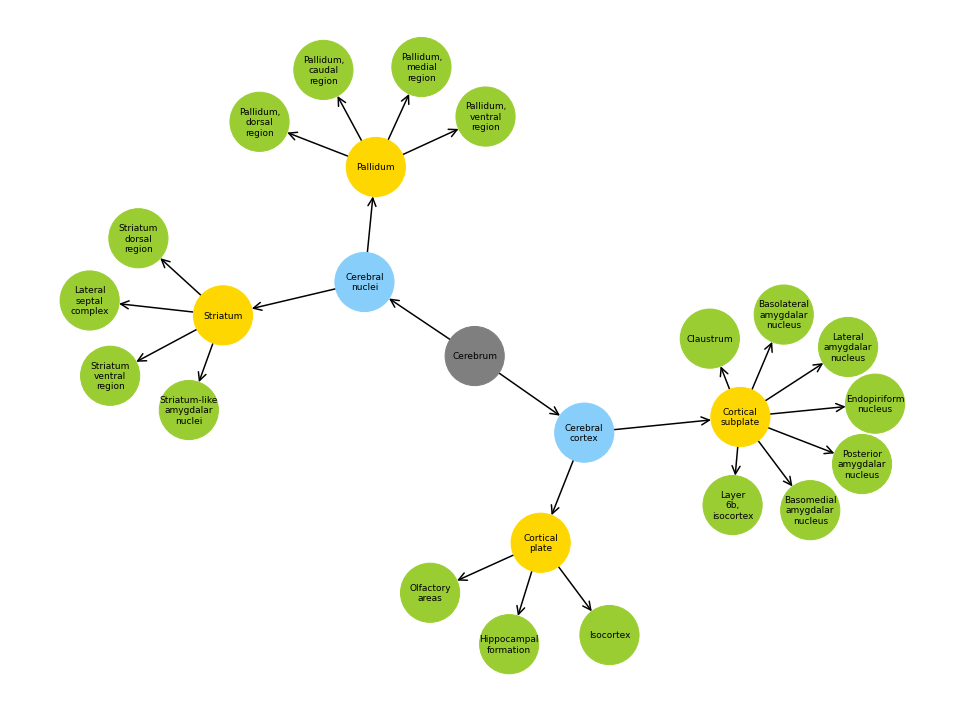

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(13.5, 10))

pos = graphviz_layout(g, prog='neato', root='Cerebrum')
node2c = {i: lvl2c[n[1]['lvl']] for i, n in enumerate(g.nodes(data=True))}
nx.draw(
    G=g,
    pos=pos,
    with_labels=True,
    arrows=True,
    arrowsize=20,
    arrowstyle='->',
    width=1.5,
    node_size=3500,
    font_size=9,
    edge_color='k',
    node_color=node2c.values(),
    ax=ax,
)
fig.tight_layout()
# fig.savefig('cerebrum_3lvls.pdf', dpi=300, bbox_inches='tight')
plt.show()

## Load other data

In [7]:
manifest_file = pjoin(allen_ws, 'MouseConnectivity', 'manifest.json')
mcc = MouseConnectivityCache(resolution=100, manifest_file=manifest_file)
structure_tree = mcc.get_structure_tree()

root = structure_tree.get_structures_by_name(['root'])[0]
cerebrum = structure_tree.get_structures_by_name(['Cerebrum'])[0]
isocortex = structure_tree.get_structures_by_name(['Isocortex'])[0]

In [8]:
all_experiments = mcc.get_experiments(dataframe=True)
selected_experiments = all_experiments.loc[all_experiments.structure_abbrev == 'SSp-bfd']
experiment_id = 657041814

# download the projection density volume for one of the experiments
pjd, pjd_info = mcc.get_projection_density(experiment_id)

# injection density: number of projecting pixels in injection site / voxel volume
ind, ind_info = mcc.get_injection_density(experiment_id)

# injection fraction: number of pixels in injection site / voxel volume
inf, inf_info = mcc.get_injection_fraction(experiment_id)

# binary mask indicating which voxels contain valid data
dm, dm_info = mcc.get_data_mask(experiment_id)

# template and annotation info
template, template_info = mcc.get_template_volume()
annot, annot_info = mcc.get_annotation_volume()

# in addition to the annotation volume, you can get binary masks for individual structures
root_mask, root_mask_info = mcc.get_structure_mask(root['id'])
cerebrum_mask, cerebrum_mask_info = mcc.get_structure_mask(cerebrum['id'])
cortex_mask, cortex_mask_info = mcc.get_structure_mask(isocortex['id'])

In [9]:
from prettytable import PrettyTable
table = PrettyTable(field_names=['lvl', 'name', '# voxels', 'relative sz'])


m0 = mcc.get_structure_mask(cerebrum['id'])[0]

names = collections.defaultdict(list)
for lvl, struct_ids in dend.items():
    for struct_id in struct_ids:
        name = structure_tree.get_structures_by_id([struct_id])[0]['name']
        if name == 'Layer 6b, isocortex':
            continue
        names[lvl].append(name)
        m1 = mcc.get_structure_mask(struct_id)[0]
        
        table.add_row([lvl, name, m1.sum(), '{:.1f} {:s}'.format(m1.sum() / m0.sum() * 100, '%')])
        
    if lvl < len(dend) - 1:
        table.add_row([''] * len(table.field_names))

names = dict(names)
print(table)

+-----+--------------------------------+----------+-------------+
| lvl |              name              | # voxels | relative sz |
+-----+--------------------------------+----------+-------------+
|  0  |            Cerebrum            |  275611  |   100.0 %   |
|     |                                |          |             |
|  1  |        Cerebral cortex         |  221252  |    80.3 %   |
|  1  |        Cerebral nuclei         |  54359   |    19.7 %   |
|     |                                |          |             |
|  2  |         Cortical plate         |  212402  |    77.1 %   |
|  2  |       Cortical subplate        |   8850   |    3.2 %    |
|  2  |            Striatum            |  45063   |    16.4 %   |
|  2  |            Pallidum            |   9296   |    3.4 %    |
|     |                                |          |             |
|  3  |           Isocortex            |  123245  |    44.7 %   |
|  3  |        Olfactory areas         |  46478   |    16.9 %   |
|  3  |   

## ROI definition (CCF space)

In [10]:
from time import time
from copy import deepcopy as dc
from sklearn.cluster import KMeans

import sklearnex
sklearnex.patch_sklearn()

Intel(R) oneAPI Data Analytics Library solvers for sklearn enabled: https://intelpython.github.io/daal4py/sklearn.html


In [11]:
num_regions = 16

parcellation = kmeans_parcellation(
    mask=cortex_mask,
    num_regions=num_regions,
    symmetrize=False,
    left_right_axis=2,
)

In [12]:
parcellation['mask_l'].sum(), parcellation['mask_r'].sum()

(61367, 61878)

In [13]:
cortex_mask[..., :57].sum(), cortex_mask[..., 57:].sum()

(61367, 61878)

In [14]:
for region_id, cluster_ctr in parcellation['cluster_centers'].items():
    if region_id > num_regions:
        break
    cluster_ctr_r = parcellation['cluster_centers'][region_id + num_regions]

    error = np.abs(cluster_ctr[:2] - cluster_ctr_r[:2]).sum() / 2
    if error > 0.2:
        print(
            region_id, np.round(error, decimals=3),
            np.round(cluster_ctr, decimals=3),
            np.round(cluster_ctr_r, decimals=3),
        )

1 0.364 [29.095 23.294 45.472] [28.642 23.568 68.149]
4 0.349 [41.291 24.63  31.839] [41.022 24.201 81.231]
5 0.268 [41.975 43.581 23.256] [41.567 43.451 90.329]
6 0.245 [46.197 18.124 48.558] [45.91  18.326 64.641]
7 0.596 [52.863 29.476 19.765] [52.005 29.142 93.549]
9 0.455 [60.788 44.656 13.779] [59.938 44.596 99.887]
11 0.575 [69.243 24.329 16.953] [68.387 24.622 96.853]
13 0.655 [78.447 38.447 10.567] [ 77.633  38.942 103.211]
15 0.6 [89.807 24.075 16.184] [89.2   24.668 98.258]


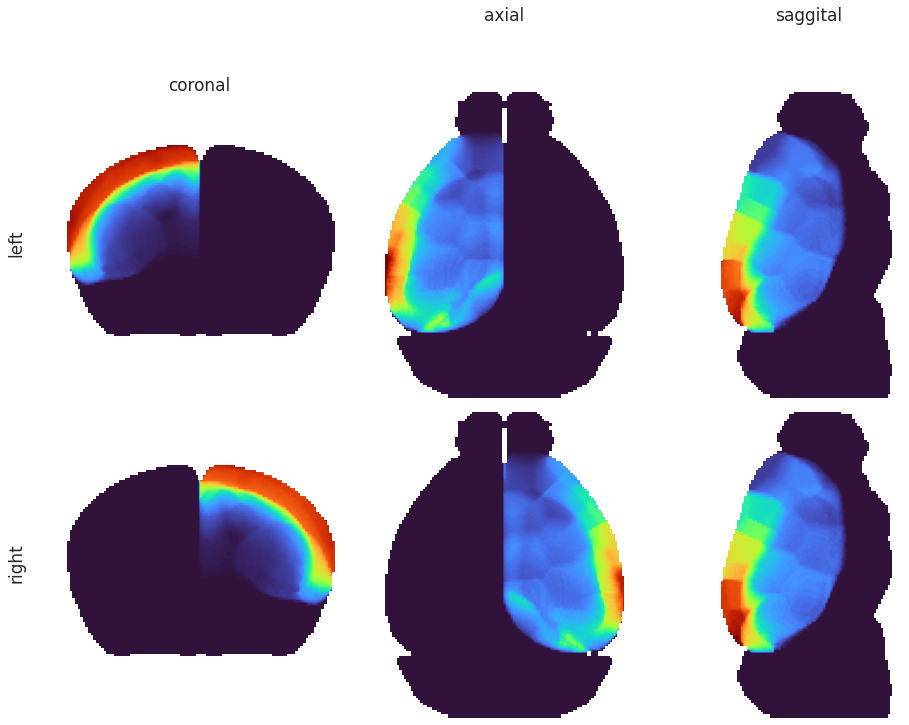

In [15]:
fig, axes = plt.subplots(2, 3, figsize=(13.5, 10))
for i in range(2):
    for j in range(3):
        x = parcellation['atlas_kmeans'].copy()

        if i == 0:
            x[parcellation['mask_r']] = 0
            label = 'left\n'
        else:
            x[parcellation['mask_l']] = 0
            x[x != 0] -= num_regions
            label = 'right\n'
            
        if j == 0:
            title = 'coronal'
        elif j == 1:
            title = 'axial'
        else:
            title = 'saggital'

        data2plt = np.ma.masked_where(~root_mask.astype(bool), x)
        axes[i, j].imshow(data2plt.mean(j), cmap='turbo')
        
        list(map(lambda x: x.set_visible(False), axes[i, j].spines.values()))
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])
        
        if i == 0:
            axes[i, j].set_title(title, fontsize=17, y=1.2)
        else:
            axes[i, j].set_title('')
        if j == 0:
            axes[i, j].set_ylabel(label, fontsize=17)

fig.tight_layout()
plt.show()

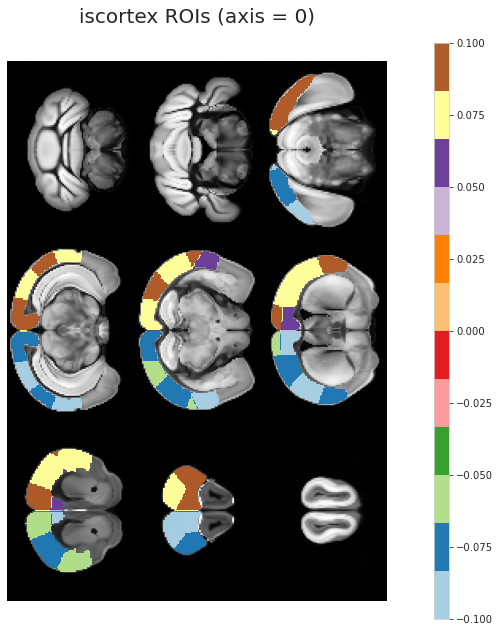

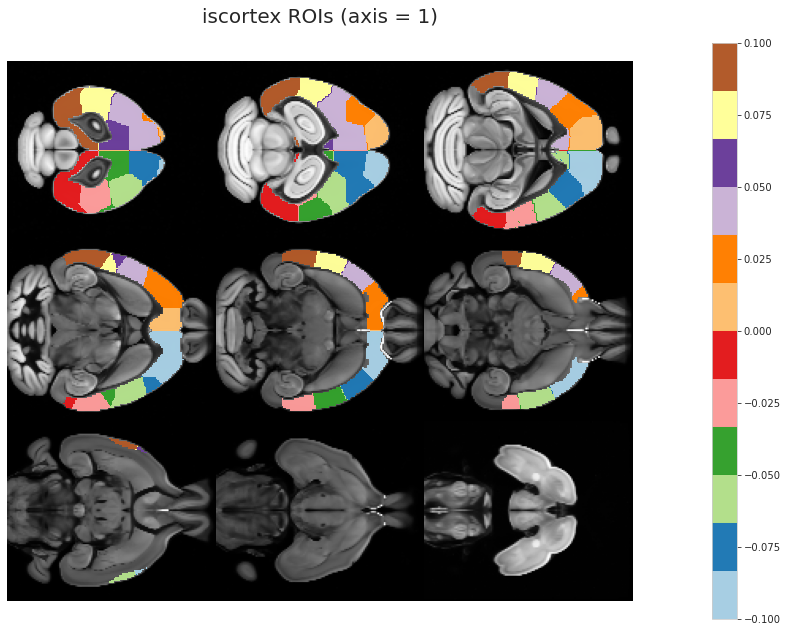

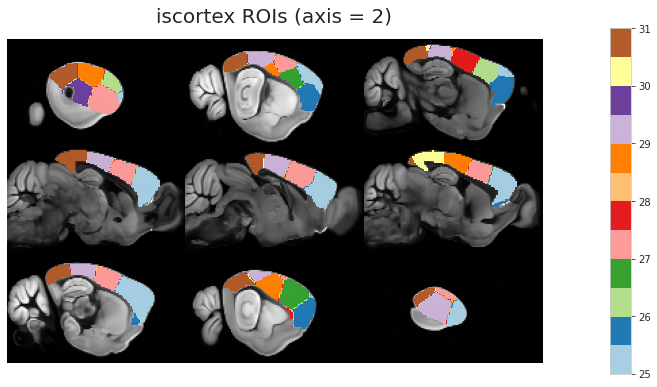

In [16]:
x = parcellation['atlas_kmeans'].copy().astype(float)
x[x == 0] = np.nan

for axis in range(3):
    ants.from_numpy(template.astype(float)).plot(
        overlay=ants.from_numpy(x),
        overlay_cmap='Paired',
        overlay_alpha=0.99,
        axis=axis,
        nslices=9,
        title='iscortex ROIs (axis = {:d})'.format(axis),
        figsize=1.5 if axis == 2 else 2.5,
        cbar=True,
        cbar_dx=0.07,
    )

<AxesSubplot:ylabel='Count'>

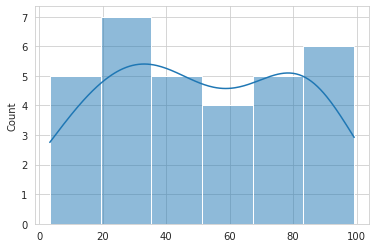

In [17]:
x = parcellation['atlas_kmeans'].copy().astype(float)
vals = []
for region_id in np.unique(x[x > 0]):
    vals.append(x[x == region_id].sum() / cortex_mask.sum() * 100)

sns.histplot(vals, kde=True)

In [18]:
#x = parcellation['atlas_kmeans'].copy().astype(float)
atlas_kmeans_eroded = np.zeros_like(parcellation['atlas_kmeans'])

radius = 5
accepted = 0
rejected = 0
for region_id, ctr in tqdm(parcellation['cluster_centers'].items(), leave=False):
    for voxel in list(zip(*np.where(parcellation['atlas_kmeans'] == region_id))):
        dist = np.linalg.norm(ctr - voxel)
        if dist < radius:
            atlas_kmeans_eroded[voxel] = region_id
            accepted += 1
        else:
            rejected += 1
            
accepted, rejected

  0%|          | 0/32 [00:00<?, ?it/s]

(16565, 106680)

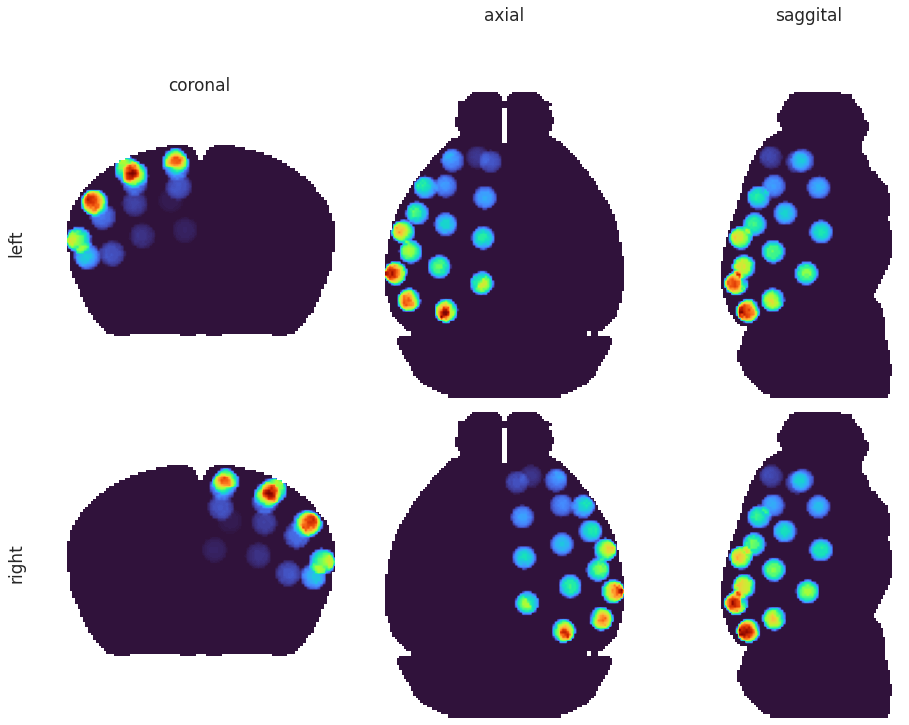

In [19]:
fig, axes = plt.subplots(2, 3, figsize=(13.5, 10))
for i in range(2):
    for j in range(3):
        x = atlas_kmeans_eroded.copy()

        if i == 0:
            x[parcellation['mask_r']] = 0
            label = 'left\n'
        else:
            x[parcellation['mask_l']] = 0
            x[x != 0] -= num_regions
            label = 'right\n'
            
        if j == 0:
            title = 'coronal'
        elif j == 1:
            title = 'axial'
        else:
            title = 'saggital'

        data2plt = np.ma.masked_where(~root_mask.astype(bool), x)
        axes[i, j].imshow(data2plt.mean(j), cmap='turbo')
        
        list(map(lambda x: x.set_visible(False), axes[i, j].spines.values()))
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])
        
        if i == 0:
            axes[i, j].set_title(title, fontsize=17, y=1.2)
        else:
            axes[i, j].set_title('')
        if j == 0:
            axes[i, j].set_ylabel(label, fontsize=17)

fig.tight_layout()
plt.show()

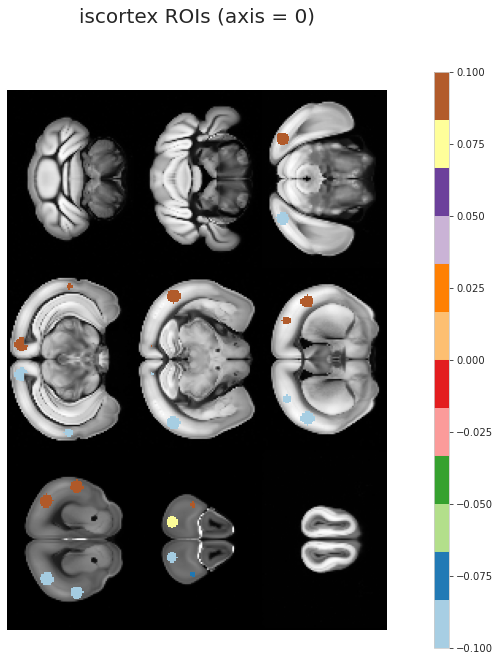

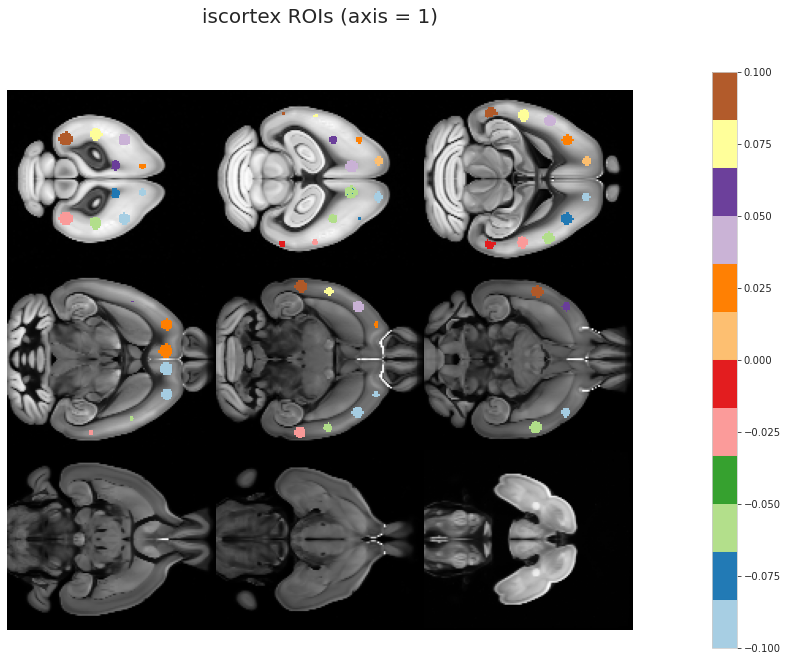

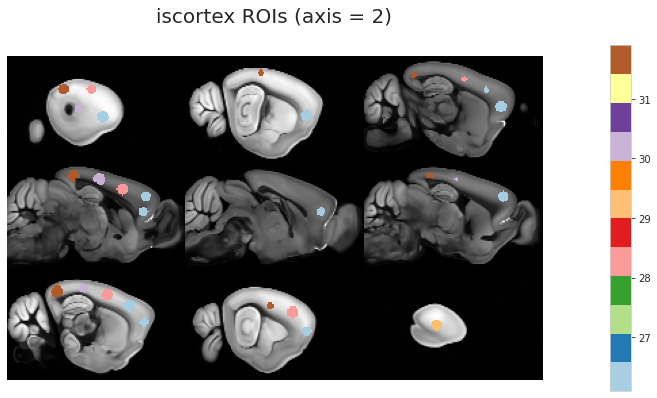

In [20]:
x = atlas_kmeans_eroded.copy().astype(float)
x[x == 0] = np.nan

for axis in range(3):
    ants.from_numpy(template.astype(float)).plot(
        overlay=ants.from_numpy(x),
        overlay_cmap='Paired',
        overlay_alpha=0.99,
        axis=axis,
        nslices=9,
        figsize=1.5 if axis == 2 else 2.5,
        title='iscortex ROIs (axis = {:d})'.format(axis),
        title_dy=0.04,
        cbar=True,
        cbar_dx=0.07,
    )

<AxesSubplot:ylabel='Count'>

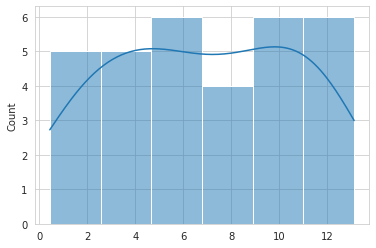

In [21]:
x = atlas_kmeans_eroded.copy().astype(float)
vals = []
for region_id in np.unique(x[x > 0]):
    vals.append(x[x == region_id].sum() / cortex_mask.sum() * 100)

sns.histplot(vals, kde=True)

In [22]:
np.min(vals), np.max(vals)

(0.43166051361109986, 13.138058339080693)

In [23]:
selected_names = [
    'Striatum',
    'Pallidum',
    'Olfactory areas',
    'Cortical subplate',
    'Hippocampal formation',
    'Isocortex',
]
selected_names

['Striatum',
 'Pallidum',
 'Olfactory areas',
 'Cortical subplate',
 'Hippocampal formation',
 'Isocortex']

In [24]:
root_mask_l, root_mask_r = mask_left_right(root_mask)
selected_structures = structure_tree.get_structures_by_name(selected_names)

roi_masks = {}
for structure_dict in selected_structures:
    print(structure_dict['name'], structure_dict['id'])
    if structure_dict['name'] == 'Isocortex':
        for region_id_l in range(1, num_regions+1):
            region_id_r = region_id_l + num_regions
            _mask_l = atlas_kmeans_eroded == region_id_l
            _mask_r = atlas_kmeans_eroded == region_id_r
            roi_masks['0-{:d}-{:d}'.format(structure_dict['id'], region_id_l)] = _mask_l.astype(bool)
            roi_masks['1-{:d}-{:d}'.format(structure_dict['id'], region_id_r)] = _mask_r.astype(bool)
    else:
        _mask = mcc.get_structure_mask(structure_dict['id'])[0]
        _mask_l = np.logical_and(_mask, root_mask_l)
        _mask_r = np.logical_and(_mask, root_mask_r)
        roi_masks['0-{:d}'.format(structure_dict['id'])] = _mask_l.astype(bool)
        roi_masks['1-{:d}'.format(structure_dict['id'])] = _mask_r.astype(bool)

Striatum 477
Pallidum 803
Olfactory areas 698
Cortical subplate 703
Hippocampal formation 1089
Isocortex 315


In [25]:
roi_masks.keys()

dict_keys(['0-477', '1-477', '0-803', '1-803', '0-698', '1-698', '0-703', '1-703', '0-1089', '1-1089', '0-315-1', '1-315-17', '0-315-2', '1-315-18', '0-315-3', '1-315-19', '0-315-4', '1-315-20', '0-315-5', '1-315-21', '0-315-6', '1-315-22', '0-315-7', '1-315-23', '0-315-8', '1-315-24', '0-315-9', '1-315-25', '0-315-10', '1-315-26', '0-315-11', '1-315-27', '0-315-12', '1-315-28', '0-315-13', '1-315-29', '0-315-14', '1-315-30', '0-315-15', '1-315-31', '0-315-16', '1-315-32'])

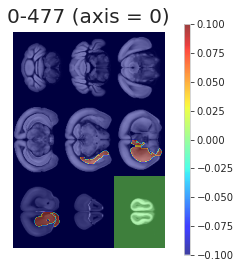

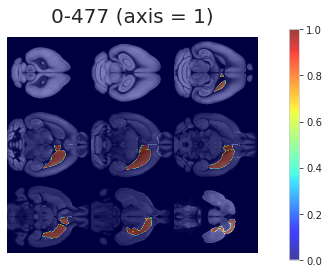

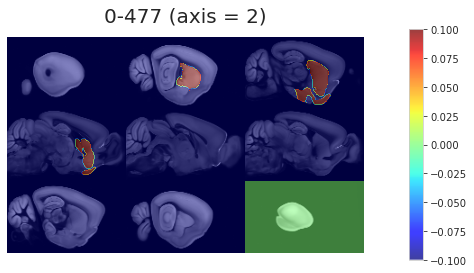

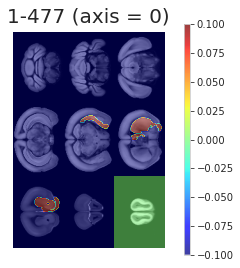

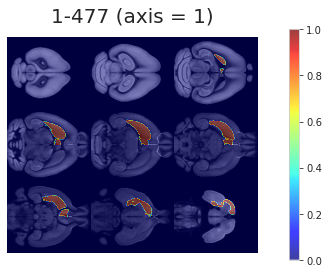

...

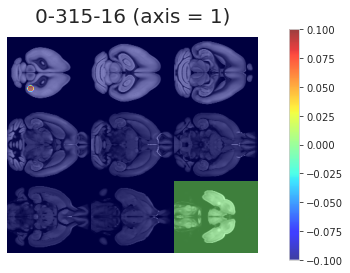

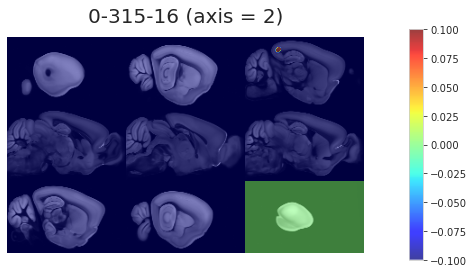

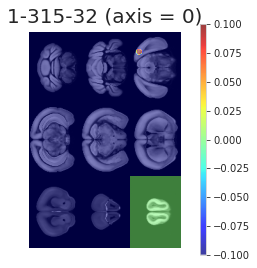

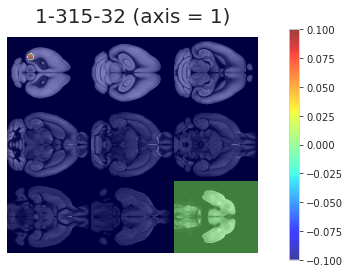

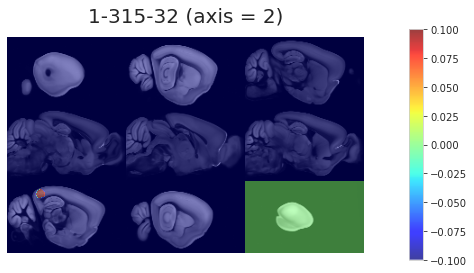

In [31]:
for key, mask in roi_masks.items():
    for axis in range(3):
        x = mask.copy().astype('uint8')
        # x[x == 0.] = np.nan
        ants.from_numpy(template.astype(float)).plot(
            overlay=ants.from_numpy(x),
            overlay_alpha=0.5,
            axis=axis,
            nslices=9,
            figsize=1,
            title='{:s} (axis = {:d})'.format(key, axis),
            title_dy=0.01 if axis == 0 else 0.03,
            cbar=True,
            cbar_dx=0.07,
        )

In [32]:
sklearnex.unpatch_sklearn()

## Spatial normalization using ANTs

In [33]:
config = Config()

func = {}
for subject in tqdm(range(1, config.num_subjects+1), leave=False):
    for session in tqdm(range(1, config.num_sessions+1), leave=False):
        if subject != 6 or session != 1:
            continue
            
        keywords = [
            'sub-SLC{:02d}'.format(subject),
            'ses-{:d}'.format(session),
            'space-individual',
        ]
                
        # func
        for run in range(1, config.num_runs+1):
            kws_func = keywords + ['run-{:d}'.format(run), 'task-rest', 'bold']
            gen = (x for x in sorted(os.listdir(config.raw_dir)) if all(k in x for k in kws_func))
            try:
                func_file = pjoin(config.raw_dir, next(gen))
            except StopIteration:
                continue
            x = nib.load(func_file).get_fdata()
            func[run] = reorient_arr(x)
        
        # anat
        kws_anat = keywords + ['T1w']
        gen = (x for x in sorted(os.listdir(config.raw_dir)) if all(k in x for k in kws_anat))
        anat_file = pjoin(config.raw_dir, next(gen))
        
        # mask
        kws_mask = keywords + ['desc-mask', 'bold']
        gen = (x for x in sorted(os.listdir(config.raw_dir)) if all(k in x for k in kws_mask))
        mask_file = pjoin(config.raw_dir, next(gen))
        
        # load anat and mask and reorient
        moving = nib.load(anat_file).get_fdata()
        mask = nib.load(mask_file).get_fdata()
        moving *= mask
        
        moving = reorient_arr(moving)
        moving_mask = ants.from_numpy(moving).get_mask().numpy()

# images in CCF space
# fixed, CH_mask, ISO_mask = [
#     ants.resample_image(ants.from_numpy(arr.astype(float)), [2]*3).numpy().astype(float)
#     for arr in [template, cerebrum_mask, cortex_mask]
#]
moving, moving_mask, fixed, CH_mask, ISO_mask = [
    ants.from_numpy(arr.astype(float), origin=[0]*3, spacing=[1.0]*3)
    for arr in [moving, moving_mask, template, cerebrum_mask, cortex_mask]
]
moving.shape, moving_mask.shape, fixed.shape, CH_mask.shape, ISO_mask.shape, func[1].shape

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

((78, 64, 64),
 (78, 64, 64),
 (132, 80, 114),
 (132, 80, 114),
 (132, 80, 114),
 (78, 64, 64, 600))

## Register

In [34]:
tx = ants.registration(
    fixed=fixed,
    moving=moving,
    mask=moving_mask,
    type_of_transform='SyN',
    verbose=True,
)

In [35]:
from prettytable import PrettyTable
table = PrettyTable(field_names=['interpolator', 'MI(fixed, warped) / MI(fixed, fixed)'])

interpolators = [
    'nearestNeighbor',
    'lanczosWindowedSinc',
    'gaussian',
    'genericLabel',
    'bSpline',
    'hammingWindowedSinc',
    'linear',
    'welchWindowedSinc',
    'multiLabel',
]

for interpolator in interpolators:
    warped = ants.apply_transforms(
        fixed=fixed,
        moving=moving,
        transformlist=tx['fwdtransforms'],
        interpolator=interpolator,
    )
    rel_mi = ants.image_mutual_information(fixed, warped) / ants.image_mutual_information(fixed, fixed)
    table.add_row([interpolator, np.round(rel_mi, decimals=3)])

print(table)

+---------------------+--------------------------------------+
|     interpolator    | MI(fixed, warped) / MI(fixed, fixed) |
+---------------------+--------------------------------------+
|   nearestNeighbor   |                0.422                 |
| lanczosWindowedSinc |                0.438                 |
|       gaussian      |                0.453                 |
|     genericLabel    |                0.422                 |
|       bSpline       |                0.439                 |
| hammingWindowedSinc |                0.439                 |
|        linear       |                0.447                 |
|  welchWindowedSinc  |                0.437                 |
|      multiLabel     |                0.332                 |
+---------------------+--------------------------------------+


In [36]:
warped = ants.apply_transforms(
    fixed=fixed,
    moving=moving,
    transformlist=tx['fwdtransforms'],
    interpolator='linear',
)
warped

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (132, 80, 114)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

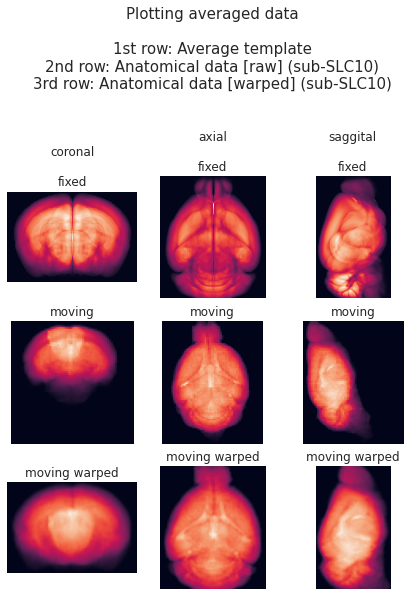

In [37]:
sns.set_style('white')
fig, axes = plt.subplots(3, 3, figsize=(6, 8))

for i in range(3):
    for j in range(3):       
        if i == 0:
            x = fixed.numpy()
            title = 'fixed'
        elif i == 1:
            x = moving.numpy()
            title = 'moving'
        else:
            x = warped.numpy()
            title = 'moving warped'

        if i == 0:
            if j == 0:
                top_title = 'coronal\n\n'
            elif j == 1:
                top_title = 'axial\n\n'
            else:
                top_title = 'saggital\n\n'
            title = top_title + title
        
        # data2plt = x.take(max_slice, axis=j)
        data2plt = x.mean(j)
        axes[i, j].imshow(data2plt)
        axes[i, j].set_title(title)
        axes[i, j].axis('off')

msg = 'Plotting averaged data\n\n'
msg += '1st row: Average template\n'
msg += '2nd row: Anatomical data [raw] (sub-SLC{:02d})\n'
msg += '3rd row: Anatomical data [warped] (sub-SLC{:02d})'
plt.suptitle(msg.format(subject, subject), fontsize=15, y=1.03)
plt.tight_layout()
plt.show()

In [40]:
fixed.shape, moving.shape, warped.shape

((132, 80, 114), (78, 64, 64), (132, 80, 114))

### Inv mask transforms

In [41]:
roi_masks_inv = {
    lbl: ants.apply_transforms(
        fixed=moving,
        moving=ants.from_numpy(mask.astype(float), origin=[0]*3, spacing=[1.0]*3),
        transformlist=tx['invtransforms'],
        interpolator='genericLabel',
    )
    for lbl, mask in roi_masks.items()
}
mask_l_inv, mask_r_inv, root_mask_inv = [
    ants.apply_transforms(
        fixed=moving,
        moving=ants.from_numpy(mask.astype(float), origin=[0]*3, spacing=[1.0]*3),
        transformlist=tx['invtransforms'],
        interpolator='genericLabel',)
    for mask in [parcellation['mask_l'], parcellation['mask_r'], root_mask]
]

In [42]:
atlas_kmeans_inv = np.zeros(moving.shape)
for key, mask_inv in roi_masks_inv.items():
    if str(isocortex['id']) not in key:
        continue
    region_id = key.split('-')[-1]
    atlas_kmeans_inv[mask_inv.numpy().astype(bool)] = region_id

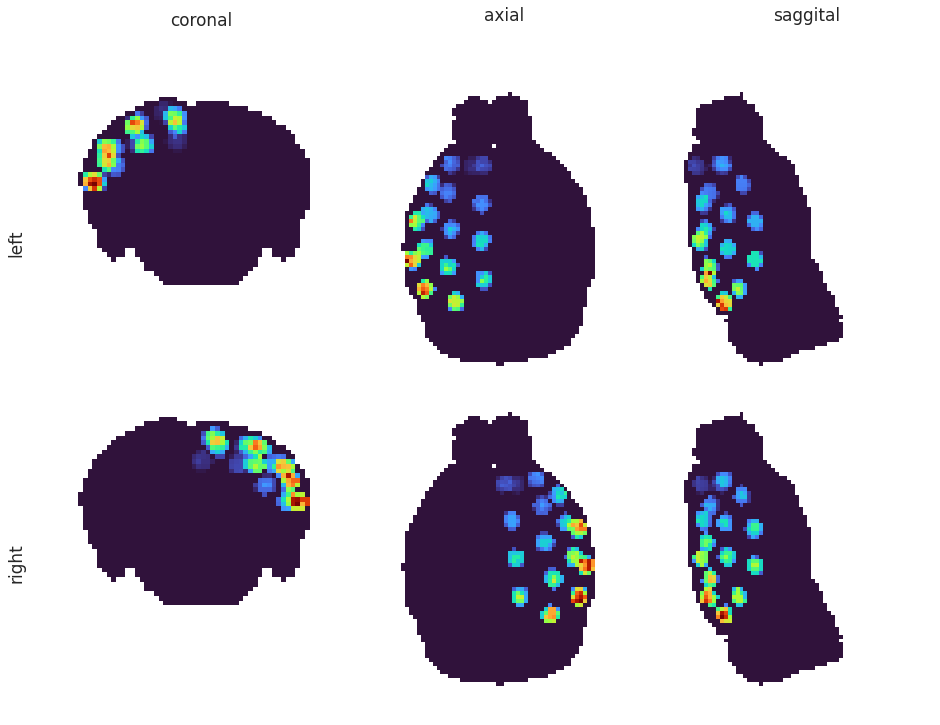

In [43]:
fig, axes = plt.subplots(2, 3, figsize=(13.5, 10))
for i in range(2):
    for j in range(3):
        x = atlas_kmeans_inv.copy()

        if i == 0:
            x[mask_r_inv.numpy().astype(bool)] = 0
            label = 'left\n'
        else:
            x[mask_l_inv.numpy().astype(bool)] = 0
            x[x != 0] -= num_regions
            label = 'right\n'
            
        if j == 0:
            title = 'coronal'
        elif j == 1:
            title = 'axial'
        else:
            title = 'saggital'

        data2plt = np.ma.masked_where(~root_mask_inv.numpy().astype(bool), x)
        axes[i, j].imshow(data2plt.mean(j), cmap='turbo')
        
        list(map(lambda x: x.set_visible(False), axes[i, j].spines.values()))
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])
        
        if i == 0:
            axes[i, j].set_title(title, fontsize=17, y=1.2)
        else:
            axes[i, j].set_title('')
        if j == 0:
            axes[i, j].set_ylabel(label, fontsize=17)

fig.tight_layout()
plt.show()

### TODO: now combine functional data from runs, compute means, and cluster

> first: try simple agglomerative hierarchical clustering
> then: try Louvain
> then: SVINET